# Scaling and Cropping

- scaling (resizing)
- image pyramids
- cropping

---
### Imports and Helper-functions

In [12]:
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [13]:
def imshow(img, title=None, size=10, axis=False, color_space="BGR"):
    aspect_ratio = img.shape[0] / img.shape[1]
    plt.figure(figsize=(size * aspect_ratio, size))
    if color_space.lower() == "bgr":
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space.lower() == "rgb":
        rgb_img = img
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    plt.imshow(rgb_img)
    if type(title) == str:
        plt.title(title)
    if axis == False:
        plt.axis('off')
    plt.show()

In [14]:
def get_random_img_path(search_path='../../res/img', skip=["flickr"]):
    """
    This function searches for common image files in all subdirectories
    and return a random image path of them.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.ico']
    image_paths = []

    # Walk through all subdirectories
    for root, dirs, files in os.walk(search_path):
        for file_name in files:
            # Check if the file is an image
            if any(file_name.lower().endswith(ext) for ext in image_extensions):
                # Get the full file path
                full_path = os.path.join(root, file_name).replace("\\", "/")
                if not any(i in full_path for i in skip):
                    image_paths.append(full_path)

    return random.choice(image_paths)

# get an image
IMG_PATH = get_random_img_path(skip=["flickr", "weather", "gem"])
IMG_PATH   

'../../res/img/chinese_art/Dataset/Qiu_Ying/Qiu_Ying_01.jpg'

---
### Loading data

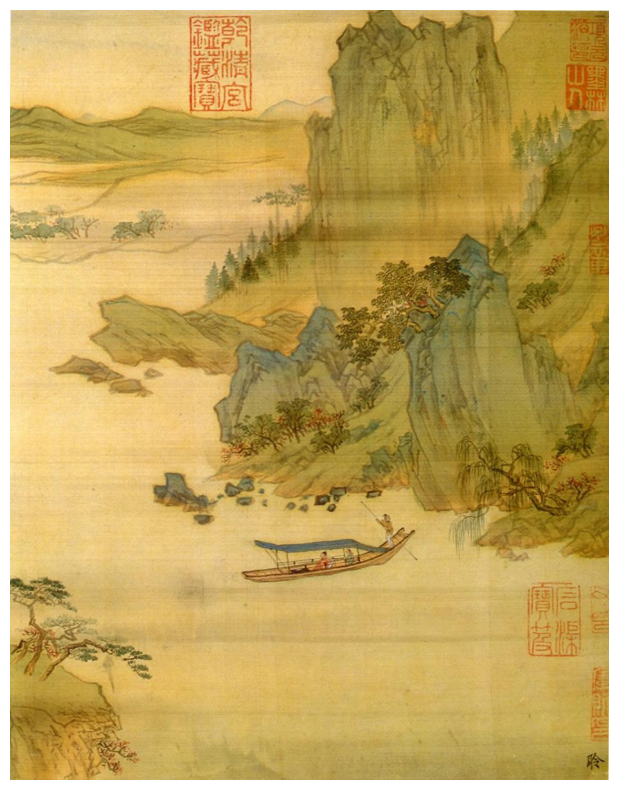

In [15]:
img = cv2.imread(IMG_PATH)
imshow(img)

---
### Scaling

```python
cv2.resize(image, output size, x scale, y scale, interpolation)
```

if the output dimension size is None, then the scale arguments will be used

Interpolations methods:
```python
cv2.INTER_NEAREST  # Nearest neighbor interpolation
cv2.INTER_LINEAR  # Bilinear interpolation (default)
cv2.INTER_LINEAR_EXACT  # Bit-exact bilinear interpolation
cv2.INTER_AREA  # Resampling using pixel area relation
cv2.INTER_CUBIC  # Bicubic interpolation over 4x4 pixel neighborhood
cv2.INTER_LANCZOS4  # Lanczos interpolation over 8x8 pixel neighborhood
```

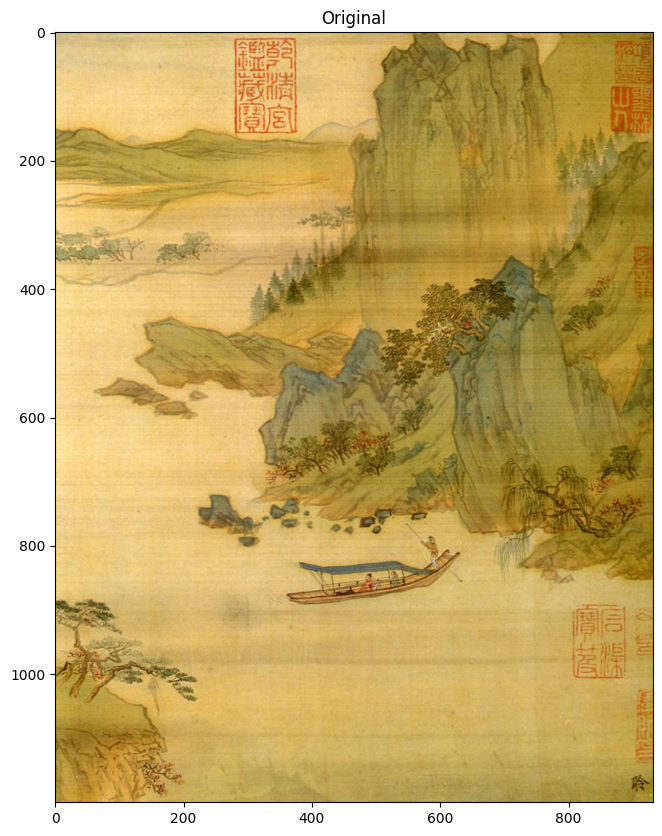

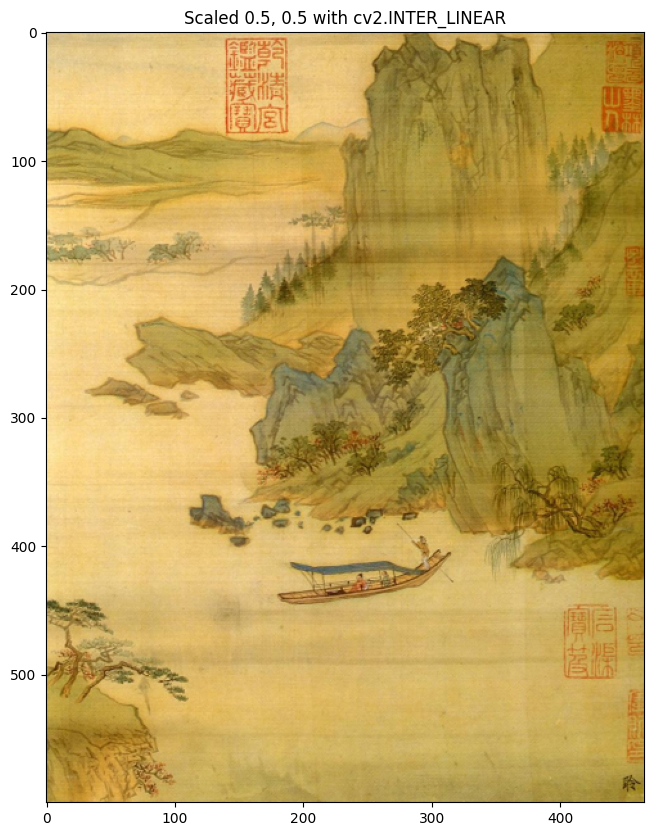

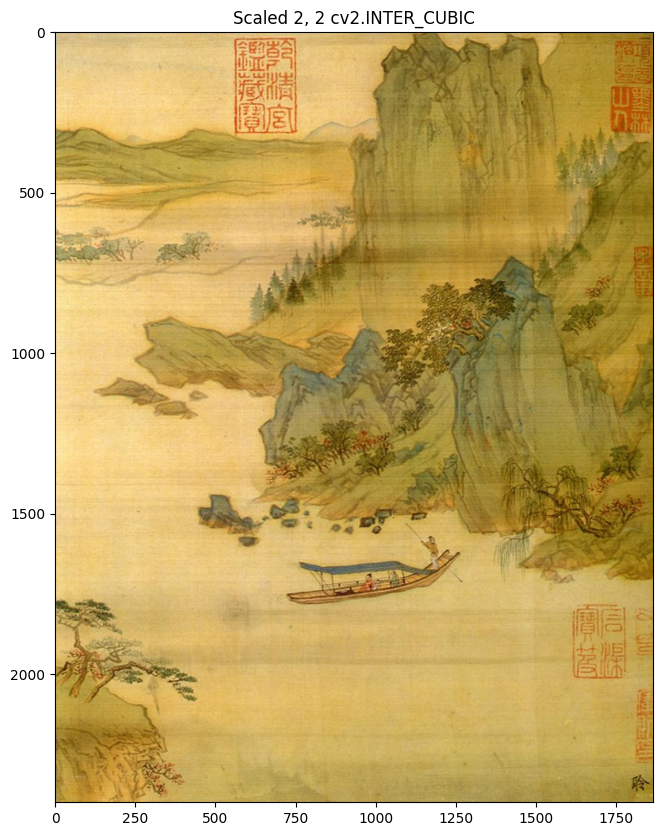

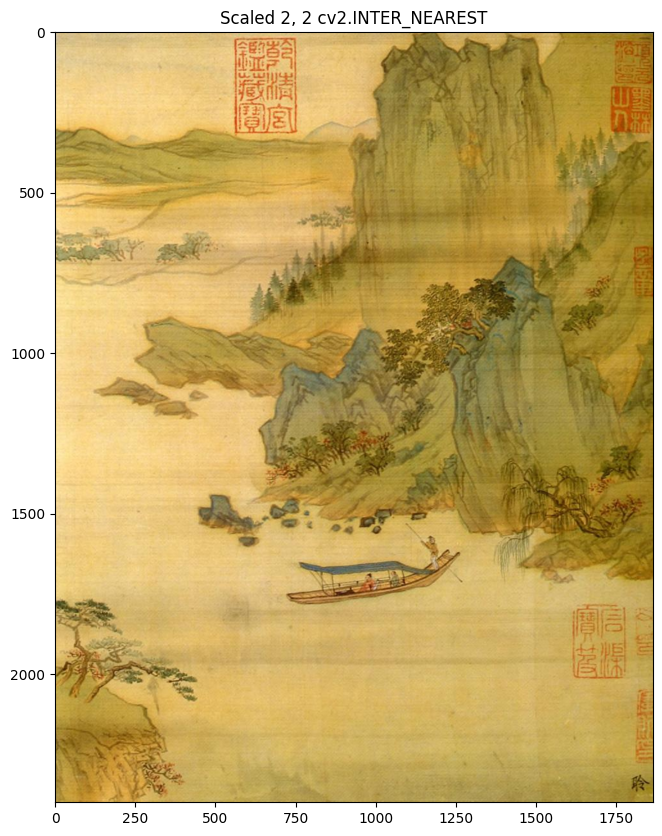

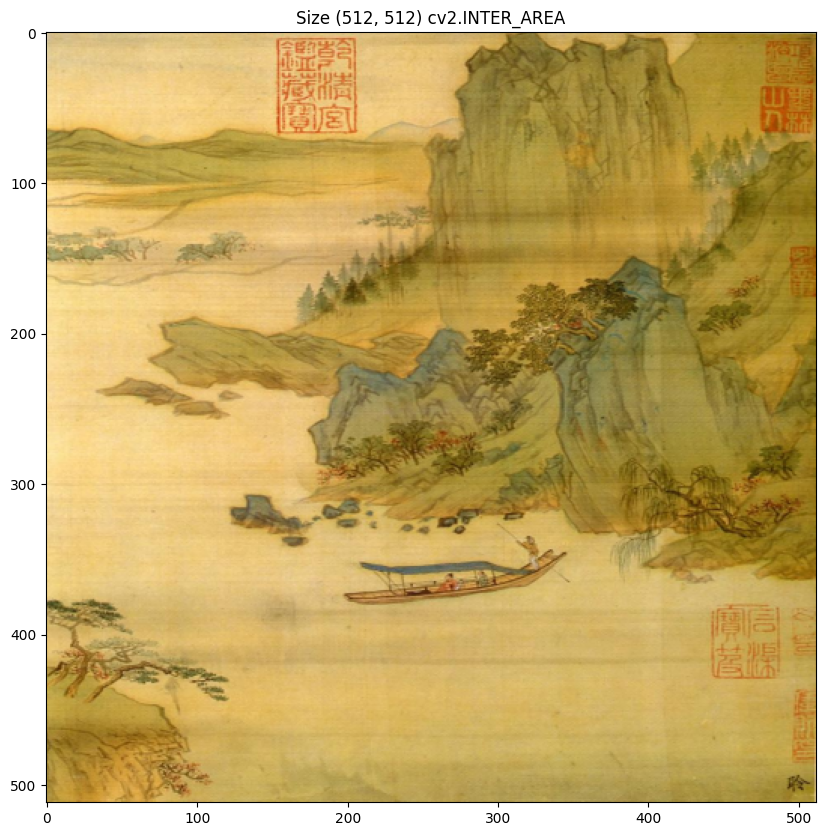

In [16]:
imshow(img, "Original", axis=True)

img_scaled = cv2.resize(img, None, fx=0.5, fy=0.5)
imshow(img_scaled, "Scaled 0.5, 0.5 with cv2.INTER_LINEAR", axis=True)

img_scaled = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
imshow(img_scaled, "Scaled 2, 2 cv2.INTER_CUBIC", axis=True)

img_scaled = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_NEAREST)
imshow(img_scaled, "Scaled 2, 2 cv2.INTER_NEAREST", axis=True)

img_scaled = cv2.resize(img, (512, 512), interpolation=cv2.INTER_AREA)
imshow(img_scaled, "Size (512, 512) cv2.INTER_AREA", axis=True)

---
### Image Pyramids

For scaling

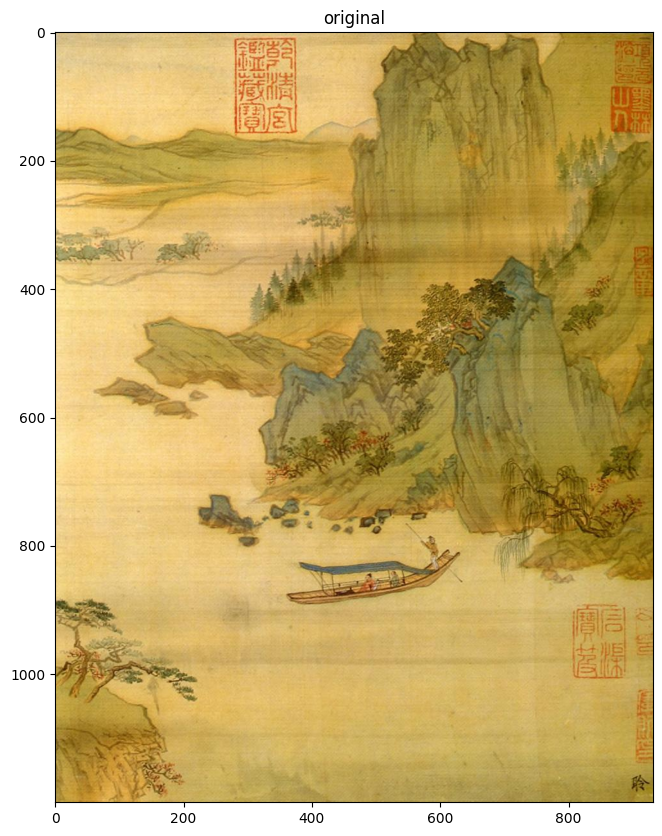

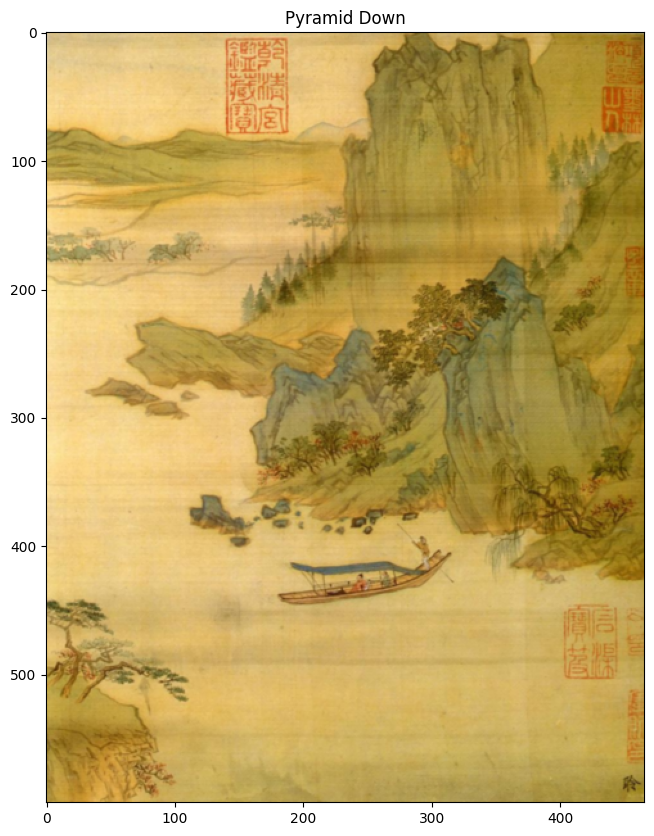

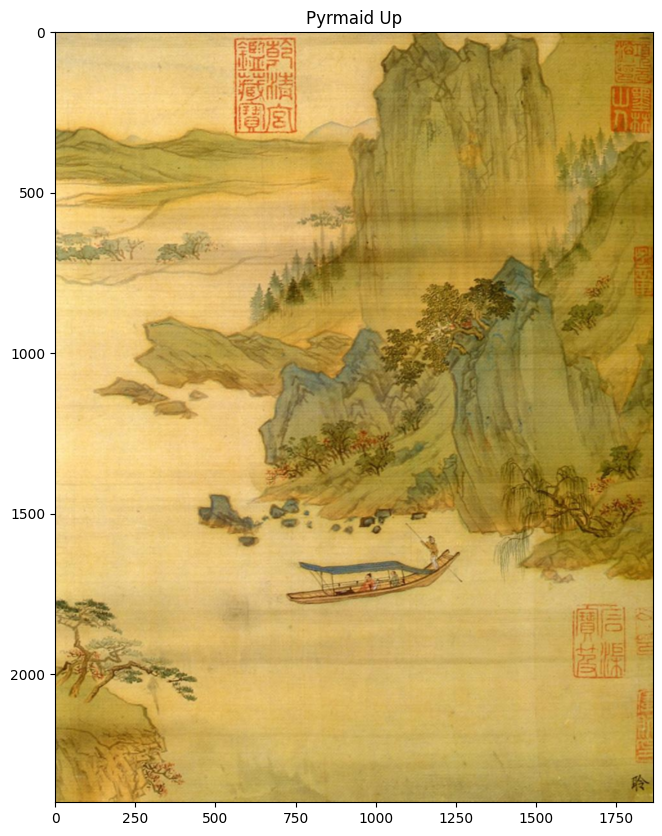

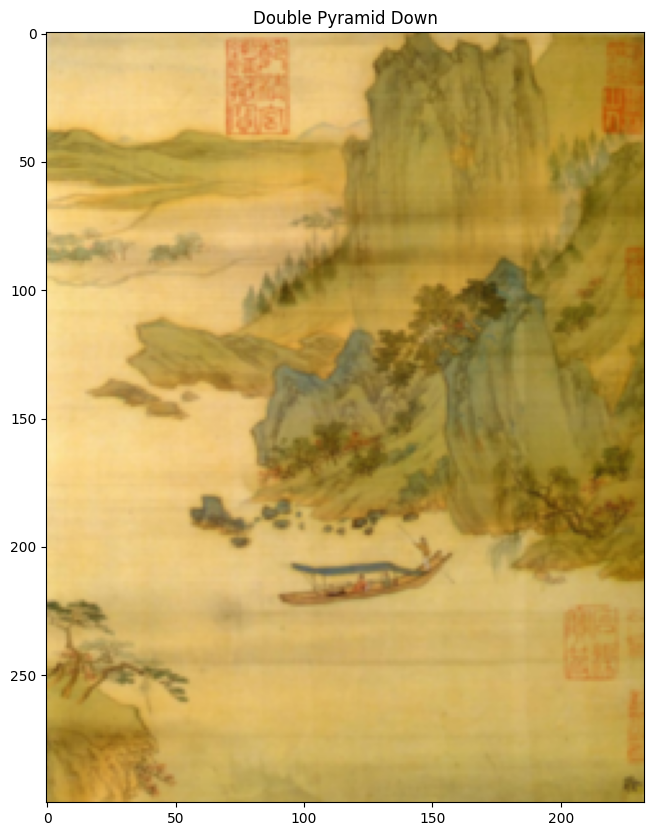

In [17]:
imshow(img, "original", axis=True)

smaller_img = cv2.pyrDown(img)
imshow(smaller_img, "Pyramid Down", axis=True)

bigger_img = cv2.pyrUp(img)
imshow(bigger_img, "Pyrmaid Up", axis=True)

double_smaller_img = cv2.pyrDown(smaller_img)
imshow(double_smaller_img, "Double Pyramid Down", axis=True)

---
### Cropping

Cropping to the center with numpy slicing

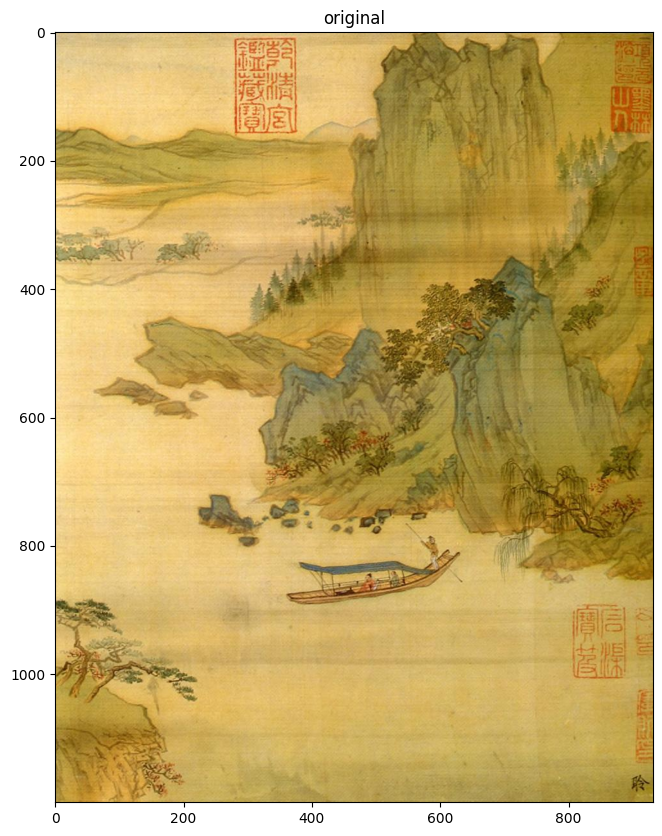

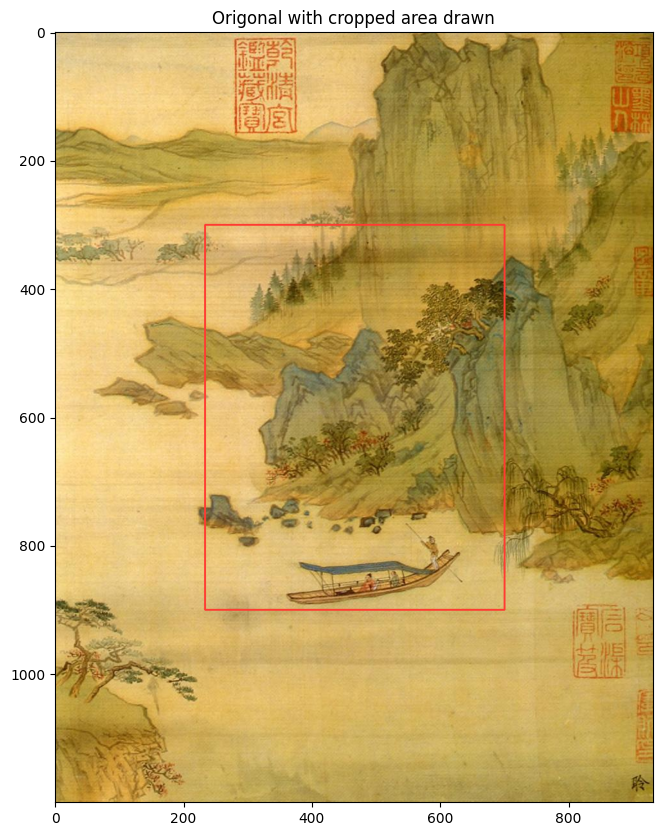

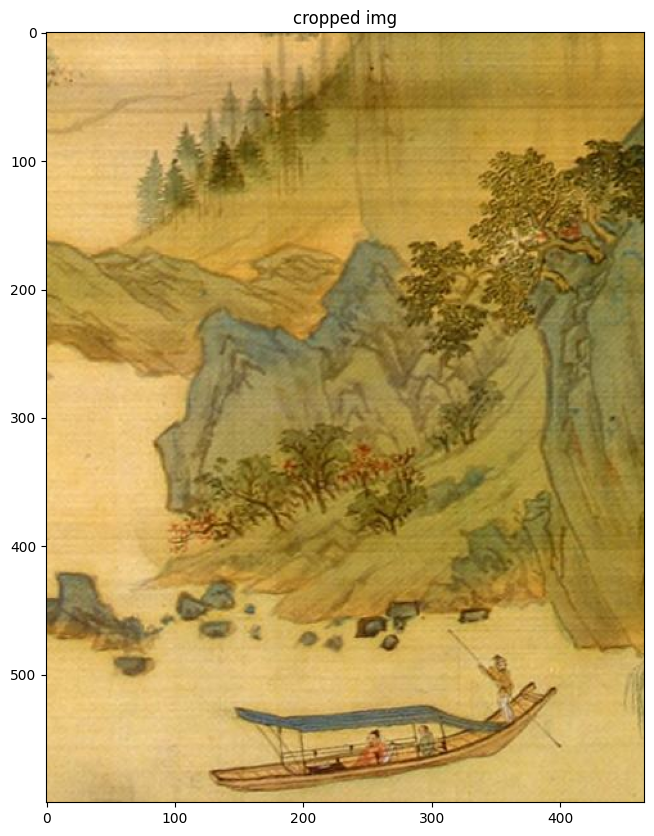

In [18]:
height, width = img.shape[:2]

crop_factor = 0.25

start_x = int(width*crop_factor)
start_y = int(height*crop_factor)
end_x = int(width*(1-crop_factor))
end_y = int(height*(1-crop_factor))

cropped_img = img[start_y:end_y, start_x:end_x]

# show the cropping
copy_img = img.copy()
cv2.rectangle(copy_img, (start_x, start_y), (end_x, end_y), (50, 60, 255), 2)

imshow(img, "original", axis=True)
imshow(copy_img, "Origonal with cropped area drawn", axis=True)
imshow(cropped_img, "cropped img", axis=True)

---